## 1. Data Preparation:

In [1]:
# Import libraries
import gzip
import json
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns



### 1.1. Unzip and convert to Df

After downloading the jsonl.gz files from https://amazon-reviews-2023.github.io/ , I unzip them and convert to DataFrame

In [2]:
import gzip
import json
import pandas as pd

def jsonl_gz_to_csv(input_file_path):
    # Load data from the .jsonl.gz file into a list of dictionaries
    data = []
    with gzip.open(input_file_path, 'rt', encoding='utf-8') as fp:
        for line in fp:
            data.append(json.loads(line.strip()))
    
    # Convert the list of dictionaries to a DataFrame
    df = pd.DataFrame(data)
    return df

# Use the function for each jsonl.gz file to convert them to DataFrame
user_review=jsonl_gz_to_csv("D:/Exeter_BA_2024/Business_Project_BEMM466_J_1_202425/El_modelling_practice/All_Beauty.jsonl.gz")
item_metadata=jsonl_gz_to_csv("D:/Exeter_BA_2024/Business_Project_BEMM466_J_1_202425/El_modelling_practice/meta_All_Beauty.jsonl.gz")

### 1.2. Merge 2 DataFrame into one main dataset: 'data'

Merge csv files: All_beauty (user_review) and meta_All_beauty (item_metadata), matching by 'parent_asin' column and create a new dataframe as 'data'

In [3]:
import pandas as pd

# Combine item_metadata into user_review, matching by 'parent_asin' column and create a new dataframe as 'data'
data = pd.merge(user_review, item_metadata, on='parent_asin', how='left') 

# Rename 'title' and 'image' columns for clarification:
data.rename(columns={'title_x': 'review_title'}, inplace=True)
data.rename(columns={'title_y': 'product_title'}, inplace=True)

data.rename(columns={'images_x': 'review_images'}, inplace=True)
data.rename(columns={'images_y': 'product_images'}, inplace=True)

# Convert the 'timestamp' column to datetime format, interpreting as milliseconds
data['timestamp'] = pd.to_datetime(data['timestamp'],unit='ms')

# Display the first few rows of the merged data to verify
data.info()

# Explore the earliest and latest dates in the 'timestamp' column
earliest_date = data['timestamp'].min()
latest_date = data['timestamp'].max()
earliest_date, latest_date

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701528 entries, 0 to 701527
Data columns (total 23 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   rating             701528 non-null  float64       
 1   review_title       701528 non-null  object        
 2   text               701528 non-null  object        
 3   review_images      701528 non-null  object        
 4   asin               701528 non-null  object        
 5   parent_asin        701528 non-null  object        
 6   user_id            701528 non-null  object        
 7   timestamp          701528 non-null  datetime64[ns]
 8   helpful_vote       701528 non-null  int64         
 9   verified_purchase  701528 non-null  bool          
 10  main_category      701528 non-null  object        
 11  product_title      701528 non-null  object        
 12  average_rating     701528 non-null  float64       
 13  rating_number      701528 non-null  int64   

(Timestamp('2000-11-01 04:24:18'), Timestamp('2023-09-09 00:39:36.666000'))

### 1.3. Split the time period using economic crisis (15/9/2008) as the milestone

Justification: September 15th, 2008, marks the collapse of Lehman Brothers, a major event in the global financial crisis as the largest bankruptcy case in U.S. history. Therefore it is often cited as a pivotal moment that signified the onset of the economic downturn

Resource: https://www.history.com/topics/21st-century/great-recession-timeline

In [ ]:
import pandas as pd

# Split the dataset
data_before_crisis = data[data['timestamp'] < '2008-09-15']
data_after_crisis = data[data['timestamp'] >= '2008-09-15']


## 2. Data Preprocessing

### 2.1. Install packages and resources


In [4]:
# Download NLTK resources
nltk.download('vader_lexicon')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\El\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\El\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\El\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\El\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

Use Swifter and Dask for faster apply operations due to the big current dataset: swifter automatically applies parallel processing to pandas operations. Install it via pip install swifter:

(if there is an error in the preprocessing step, open command promt and install the upgraded version:
#pip install --upgrade pandas dask swifter )

In [5]:
pip install swifter


Note: you may need to restart the kernel to use updated packages.


Use Dask for Parallelized Data Processing: Dask can split large dataframes into smaller chunks and process them in parallel:

In [6]:
pip install dask

Note: you may need to restart the kernel to use updated packages.


Use langdetect to filter out all non-english reviews, reducing noise in the preprocessed results

In [7]:
!pip install langdetect

  Using cached langdetect-1.0.9-py3-none-any.whl


### 2.2. Data Preprocessing: Tokenization, Lemmatization, and Stop-word removal

This code processes textual data from the dataset 'data' for two distinct tasks: sentiment analysis and topic modeling, with the help of Swifter, Dask and Langdetect, so each part of text preprocessing can be optimized. Moreover, I move stopwords and lemmatizer initialization outside the function to avoid reloading them on each iteration.


##### Step 1: Define custom stopwords for each process

So normally, the sentiment-carrying words like "like, love, great" are not really insightful for Topic Modeling and they can skew Topic Modeling Results. But they are really neccessary for sentiment analysis, defining the corresponding sentiment for each review. So that why I decide to define 2 separate customed stopwords for each task: Include sentiment words only in custom stopwords for topic modelling.

##### Step 2: Create a function to detect English reviews

##### Step 3: Create 2 preprocessing functions for each task, using different defined custom stopwords

##### Step 4: Filter only English reviews before applying 2 preprocessing to the dataset: one for topic modelling, one for sentiment analysis, drawing the results as 2 columns: 
- 'cleaned_text_for_sentiment'
- 'cleaned_text_for_topics'


FYI: In this step, it takes about 30 - 40 minutes for Python to process, mainly due to the language detect function. If it's only Swifter and Dask, just about ~ 10 minutes

In [9]:
# Import necessary libraries
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import swifter
from langdetect import detect, DetectorFactory
import re

# Define custom stopwords for each process:
custom_stopwords_for_sentiment = {
    'product', 'amazon', 'buy', 'use', 'item', 'review', 'order',
    'really', 'much', 'very', 'quite', 'always', 'often', 'usually', 'maybe', 'probably',
    'basically', 'actually', 'though', 'however', 'also', 'even', 'get', 'got', 
    'you', 'we', 'they', 'he', 'she', 'it', 'us', 'them', 'i', 'me', 'my', 'your', 'their', 'mine', 'ours'
}
custom_stopwords_for_topics = {
'2','3','5','absolutely','actually','also','always','amazing','amazon','anything','apply','around','arrived','awesome','awful','b','back','bad','basically','best',
 'better','bit','body','bottle','bought','boy','br','broken','buy','cheap','child','children','clean','close','color','come','comfortable','cool','could','creature',
 'customer','cut','cute','daughter','day','de','dentist','describe','described','didnt','different','doesnt','does','dont','do','dry','e','easy','el','even','ever',
 'every','everything','exactly','excellent','expect','expected','face','fast','feel','find','fine','first','fit','found','full','get','girl','give','go','good',
 'got','great','hair','hard','he','help','hold','however','husband','i','im','it','item','ive','job','keep','la','lash','last','le','length','like','line','little',
 'long','look','love','loved','make','made','maybe','me','mine','model','month','mouth','much','muy','my','natural','need','never','new','nice','nothing','often',
 'okay','old','one','order','ours','people','perfect','picture','polish','probably','product','que','quite','really','receive','received','recommend','result',
 'review','ruth','say','scent','see','she','show','skin','small','smell','smooth','soft','something','son','stay','still','stuff','super','take','terrible',
 'thank','their','them','they','thick','thin','thing','things','think','thought','though','time','tried','try','two','una','unit','us','use','used','using',
 'usually','very','want','waste','way','we','wear','week','well','wife','without','work','worked','worst','worth','would','year','you','your'
}

# Create stopword sets for each task
stop_words_for_sentiment = set(stopwords.words('english')).union(custom_stopwords_for_sentiment)
stop_words_for_topics = set(stopwords.words('english')).union(custom_stopwords_for_topics)


# Initialize lemmatizer and seed for langdetect
lemmatizer = WordNetLemmatizer()
DetectorFactory.seed = 42

# Function to check if text is in English
def is_english(text):
    try:
        return detect(text) == 'en'
    except:
        return False

# Define preprocessing functions
def preprocess_for_sentiment(text):
    text = ''.join([char if char.isalnum() or char.isspace() else '' for char in text]).lower()
    tokens = word_tokenize(text)
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words_for_sentiment]
    return ' '.join(tokens)

def preprocess_for_topics(text):
    text = ''.join([char if char.isalnum() or char.isspace() else '' for char in text]).lower()
    tokens = word_tokenize(text)
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words_for_topics]
    return ' '.join(tokens)

# Filter the dataset for English-only reviews
data['is_english'] = data['text'].fillna('').swifter.apply(is_english)
data = data[data['is_english']].drop(columns=['is_english'])

# Apply 2 preprocessing to the dataset: one for topic modelling, one for sentiment analysis
data['cleaned_text_for_sentiment'] = data['text'].fillna('').swifter.apply(preprocess_for_sentiment)
data['cleaned_text_for_topics'] = data['text'].fillna('').swifter.apply(preprocess_for_topics)

# Display results
data[['text', 'cleaned_text_for_sentiment', 'cleaned_text_for_topics']].head(10)

Pandas Apply:   0%|          | 0/647505 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/647505 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/647505 [00:00<?, ?it/s]

,text,cleaned_text_for_sentiment,cleaned_text_for_topics
0,This spray is really nice. It smells really go...,spray nice smell good go fine trick say feel l...,spray smell go trick feel lot texture lot medi...
1,"This product does what I need it to do, I just...",need wish odorless soft coconut smell head sme...,wish odorless coconut head orange coffee offpu...
3,Felt synthetic,felt synthetic,felt synthetic
4,Love it,love,
5,The polish was quiet thick and did not apply s...,polish quiet thick apply smoothly let dry over...,quiet smoothly let overnight adding second coa...
6,Great for many tasks. I purchased these for m...,great many task purchased makeup removal makeu...,many task purchased makeup removal makeup wash...
7,These were lightweight and soft but much too s...,lightweight soft small liking would preferred ...,lightweight liking preferred together loc reas...
8,This is perfect for my between salon visits. I...,perfect salon visit using twice week month abs...,salon visit twice look feel silky follow instr...
9,I get Keratin treatments at the salon at least...,keratin treatment salon least 34 time year wou...,keratin treatment salon least 34 time afford m...
10,I was very disappointed when I got this facial...,disappointed facial scrub assumed like scrub w...,disappointed facial scrub assumed scrub wasnt ...


## 3. Customized Dictionary Construction

### 3.1. Preprocess Product Title to extract informative key words

This code is designed to preprocess product titles, extracting relevant keywords and then estimating the optimal number by analyzing the coverage of these keywords. After that, the defined number of keywords from product title will be combined with the standard corpora.Dictionary in the LDA later. 

In this step, I would like to figure out the estimated optimal number of keywords that contribute to 95% of the total frequency of words. The output is a list of keyword ranks that contribute to the specified coverage threshold and a plot showing the cumulative frequency of keywords: the "elbow" point where adding more keywords results in diminishing returns in terms of coverage.

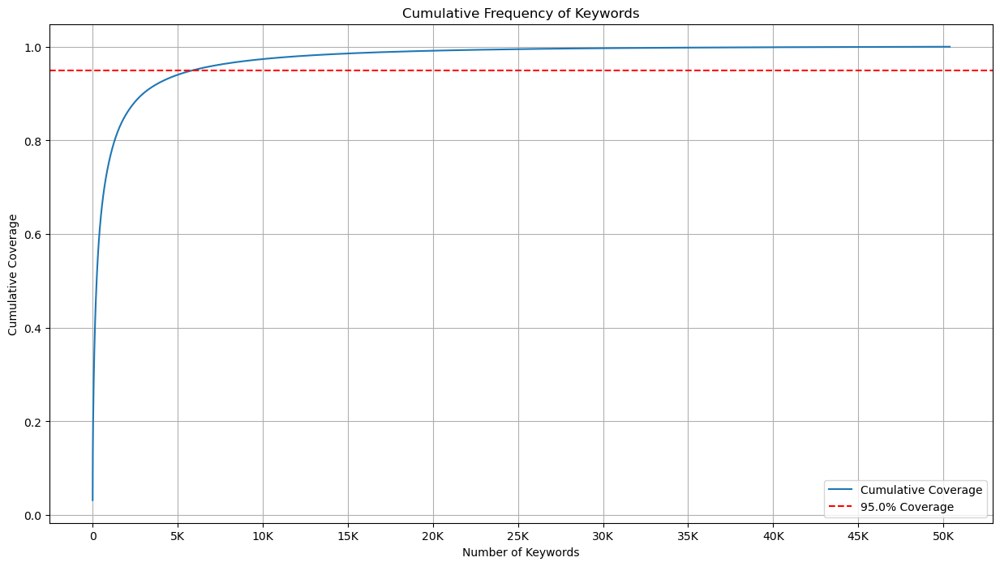

Estimated optimal number of keywords: [5906]


In [13]:
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from collections import Counter
import matplotlib.pyplot as plt
import pandas as pd
import re 
import numpy as np

# Preprocess Product Titles
def preprocess_titles(titles, stopwords):
    processed_keywords = []
    for title in titles:
        words = re.findall(r'\b\w+\b', title.lower())  # Tokenize
        filtered_words = [word for word in words if word not in stopwords and not word.isdigit()]
        processed_keywords.extend(filtered_words)
    return processed_keywords

# Analyze the coverage of keywords
def estimate_keyword_range(data, stopwords, coverage_threshold=0.95):
    from collections import Counter
    import matplotlib.pyplot as plt
    
    # Preprocess product titles to extract keywords
    processed_keywords = preprocess_titles(data['product_title'].dropna(), stopwords)
    keyword_freq = Counter(processed_keywords)
    
    # Calculate cumulative frequency
    total_freq = sum(keyword_freq.values())
    cumulative_freq = 0
    keyword_ranges = []
    for rank, (keyword, freq) in enumerate(keyword_freq.most_common(), start=1):
        cumulative_freq += freq
        if cumulative_freq / total_freq >= coverage_threshold:
            keyword_ranges.append(rank)
            break
    
    
    # Plot cumulative frequency for better interpretation.
    cumulative_values = []
    cumulative_total = 0
    for _, freq in keyword_freq.most_common():
        cumulative_total += freq
        cumulative_values.append(cumulative_total / total_freq)
    
    plt.figure(figsize=(15, 8))
    plt.plot(range(1, len(cumulative_values) + 1), cumulative_values, label="Cumulative Coverage")
    plt.axhline(y=coverage_threshold, color='r', linestyle='--', label=f'{coverage_threshold * 100}% Coverage')
    plt.title("Cumulative Frequency of Keywords")
    plt.xlabel("Number of Keywords")
    plt.xticks(np.arange(0, 55000, 5000), [f"{int(val/1000)}K" if val > 0 else "0" for val in np.arange(0, 55000, 5000)])
    plt.ylabel("Cumulative Coverage")
    plt.grid(True)
    plt.legend()
    plt.show()
    
    return keyword_ranges

# Run the function and draw the plot and result number:
keyword_range = estimate_keyword_range(data, custom_stopwords_for_topics)
print(f"Estimated optimal number of keywords: {keyword_range}")


### 3.2. Create the custom dictionary 
The keywords from product titles are extracted and added as a small, domain-specific dictionary with the number equals the optimal number as 'keyword_range' from the code in 3.1., then they will be merged with a larger dictionary derived from the tokenized review text by corpora Dictionary function

The final dictionary contains terms from both product titles and user reviews, ensuring comprehensive coverage for topic modeling.

- Top Keywords from Product Titles:
The dictionary includes the most frequent keywords extracted from the product_title column after preprocessing (removal of stopwords and irrelevant terms), contributing to the 95% cumulative frequency.

- Standard Corpora Dictionary (User Reviews):
The dictionary also includes the tokenized terms from the cleaned_text_for_topics column, which represent user reviews.

In [ ]:
# Define the optimal number of keywords and create the dictionary
def create_final_dictionary(data, top_n, stopwords):
    from gensim import corpora
    from collections import Counter

    # Preprocess product titles
    processed_keywords = preprocess_titles(data['product_title'].dropna(), stopwords)
    keyword_freq = Counter(processed_keywords)
    
    # Get the top-N keywords
    top_keywords = keyword_freq.most_common(top_n)
    
    # Tokenize cleaned_text_for_topics
    tokenized_texts = data['cleaned_text_for_topics'].dropna().str.split().tolist()
    cleaned_text_dictionary = corpora.Dictionary(tokenized_texts)
    
    # Prepare the keyword dictionary
    keyword_dict = corpora.Dictionary([[keyword for keyword, _ in top_keywords]])
    
    # Merge the dictionaries
    keyword_dict.merge_with(cleaned_text_dictionary)
    return keyword_dict

# Update the optimal number of keywords
optimal_keywords = int(keyword_range[0])  

# Create the final dictionary
final_dictionary = create_final_dictionary(data, optimal_keywords, custom_stopwords_for_topics)

# Save the final dictionary (optional)
#def save_dictionary(dictionary, filename="custom_dictionary.txt"):
    #dictionary.save_as_text(filename)
    #print(f"Dictionary saved to {filename}")

# Save the final dictionary
#save_dictionary(final_dictionary)



--
### 4. Topic Modelling (LDA)

This code applies Latent Dirichlet Allocation (LDA) to identify topics within a text corpus (reviews or documents) for two periods: before and after a crisis. It uses Gensim’s LdaMulticore model for topic modeling, making it faster to train the LDA model on large datasets.

Step 1: The function is created to train an LDA model on the cleaned_text_for_topics (preprocessed results for topic modelling). It contains:
- data: The input data containing the text documents.
- dictionary: take the formulated final dictionary above. It is used to convert the text data into a Bag-of-Words (BoW) format.
- num_topics: The number of topics the LDA model in the corpus (is 5).
- passes: The number of times the model will go through the entire corpus

The text is first tokenized using the str.split() method in Pandas.The str.split() method splits each document into a list of words, then the result is converted into a list of lists of tokens.

A BoW corpus is created by passing each tokenized text through the dictionary’s doc2bow method, which converts the words into a numeric format (a list of tuples, where each tuple contains the word ID and its frequency in the document).

Finally, the LDA model is trained using the LdaMulticore method from Gensim, where:
- corpus is the list of documents in BoW format.
- id2word is the dictionary used to map word IDs to words.
- num_topics specifies the number of topics the model should generate.
- passes=5 means the model will go through the entire corpus five times to refine the topic distribution.
- workers=4 indicates that four CPU cores will be used to speed up the training.

The function returns the trained LDA model (lda_model) and the BoW corpus (corpus).

Step 2: call the function for each period.

In [ ]:
from gensim.models import LdaModel
from gensim.models import LdaMulticore

import pandas as pd

# Split the dataset
data_before_crisis = data[data['timestamp'] < '2008-09-15']
data_after_crisis = data[data['timestamp'] >= '2008-09-15']


#Step 1: Apply LDA to identify topics for each period
def apply_lda(data, dictionary, num_topics=5, passes=10):
    # Tokenize the cleaned_text_for_topics column
    tokenized_texts = data['cleaned_text_for_topics'].dropna().str.split().tolist()
    
    # Create a Bag-of-Words corpus using the dictionary
    corpus = [dictionary.doc2bow(text) for text in tokenized_texts]
    
    # Train the LDA model
    lda_model = LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=5, workers=4, random_state=42)
    #Gensim’s LdaMulticore allows parallel processing, which can significantly speed up training on multi-core systems.

    # Display the top words for each topic
    topics = lda_model.print_topics(num_words=10)
    for topic_id, topic in topics:
        print(f"Topic {topic_id}: {topic}")
    
    return lda_model, corpus

#Step 2: Call the function
# Apply LDA for data before the crisis
print("Topics Before the Crisis:")
lda_before_crisis, corpus_before = apply_lda(data_before_crisis, final_dictionary, num_topics=5, passes=10)

# Apply LDA for data after the crisis
print("\nTopics After the Crisis:")
lda_after_crisis, corpus_after = apply_lda(data_after_crisis, final_dictionary, num_topics=5, passes=10)


Topics Before the Crisis:
Topic 0: 0.015*"shave" + 0.014*"razor" + 0.013*"shaver" + 0.011*"norelco" + 0.007*"battery" + 0.006*"head" + 0.006*"year" + 0.006*"shaving" + 0.006*"charge" + 0.006*"electric"
Topic 1: 0.007*"shave" + 0.007*"shaver" + 0.004*"razor" + 0.003*"head" + 0.002*"shaving" + 0.002*"norelco" + 0.002*"braun" + 0.001*"electric" + 0.001*"cleaning" + 0.001*"blade"
Topic 2: 0.002*"trimmer" + 0.001*"shaver" + 0.001*"shave" + 0.001*"norelco" + 0.001*"beard" + 0.001*"work" + 0.001*"battery" + 0.001*"vacuum" + 0.001*"razor" + 0.001*"shaving"
Topic 3: 0.006*"razor" + 0.004*"trimmer" + 0.003*"brush" + 0.002*"head" + 0.002*"toothbrush" + 0.001*"shave" + 0.001*"norelco" + 0.001*"vacuum" + 0.001*"battery" + 0.001*"charge"
Topic 4: 0.002*"trimmer" + 0.002*"razor" + 0.001*"shave" + 0.001*"beard" + 0.001*"shaving" + 0.001*"work" + 0.001*"trim" + 0.001*"year" + 0.001*"charge" + 0.001*"product"

Topics After the Crisis:
Topic 0: 0.014*"money" + 0.014*"lash" + 0.007*"curl" + 0.007*"disappo

##### Visualize topics by WordCloud

WordCloud for Topics Before the Crisis:


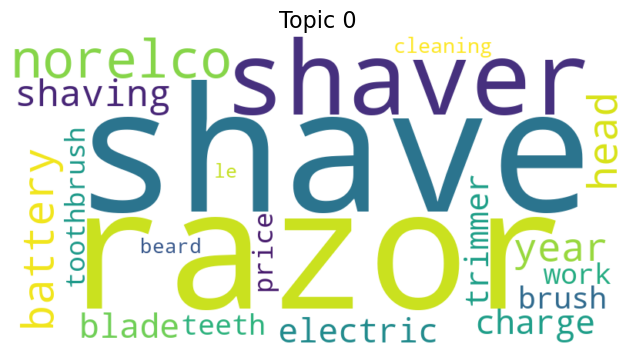

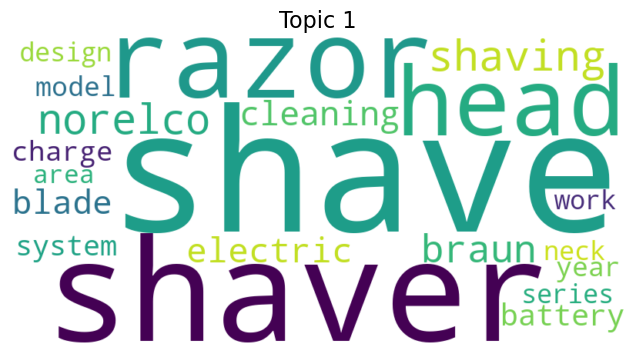

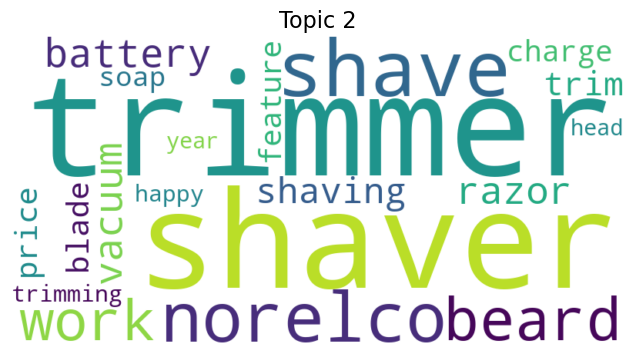

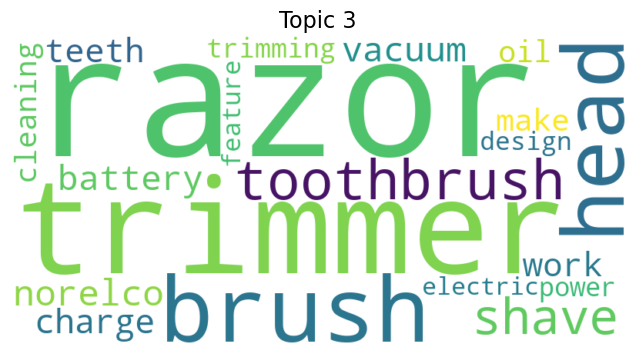

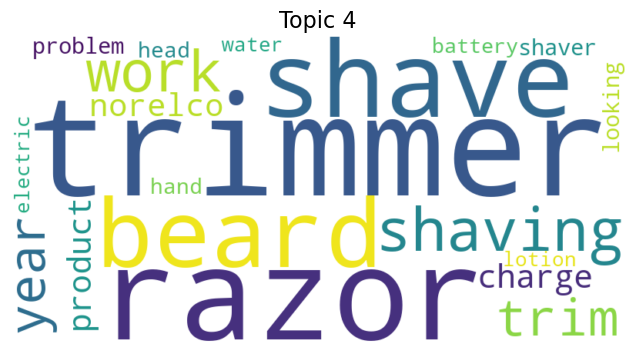

WordCloud for Topics After the Crisis:


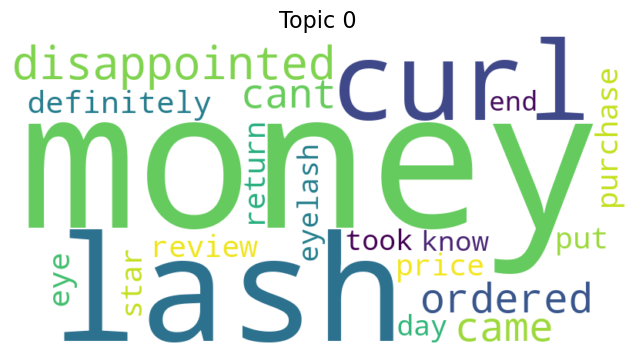

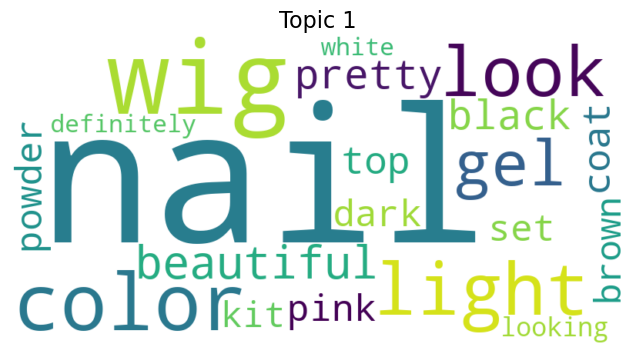

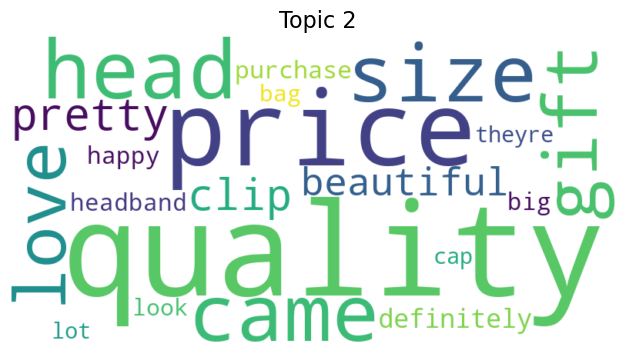

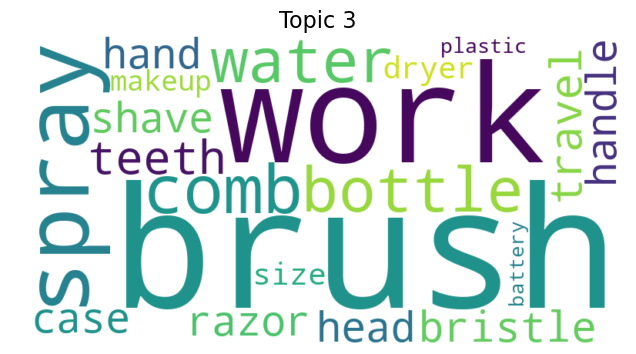

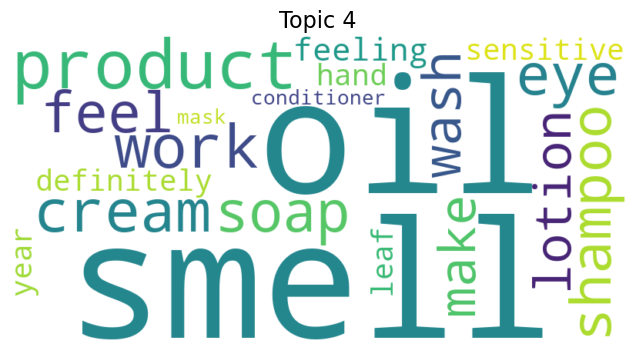

In [17]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to visualize topics with WordCloud
def visualize_topics_wordcloud(lda_model, num_topics=5):
    for topic_id in range(num_topics):
        # Extract the top words for the topic
        topic_words = dict(lda_model.show_topic(topic_id, topn=20))
        
        # Generate a word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_words)
        
        # Plot the word cloud
        plt.figure(figsize=(8, 4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic_id}", fontsize=16)
        plt.show()

# Visualize topics for "Before the Crisis"
print("WordCloud for Topics Before the Crisis:")
visualize_topics_wordcloud(lda_before_crisis, num_topics=5)

# Visualize topics for "After the Crisis"
print("WordCloud for Topics After the Crisis:")
visualize_topics_wordcloud(lda_after_crisis, num_topics=5)


##### Visualize by pyLDAvis

In [34]:
pip install pyLDAvis

Note: you may need to restart the kernel to use updated packages.


I integrate the use of pyLDAvis with Gensim to visualize the topics generated by LDA, allowing for the interactive exploration of the topics, and then I save the visualizations as HTML files that can be shared or viewed outside of the Jupyter Notebook

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models
from IPython.display import display, HTML

# Enable pyLDAvis inline for Jupyter Notebooks and create the interactive visualizations
pyLDAvis.enable_notebook()

# Function to prepare and display pyLDAvis visualization
def visualize_topics_pyLDAvis(lda_model, corpus, dictionary, title="LDA Topics", file_name="lda_vis.html"):
    lda_vis_data = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
    print(f"{title}:")
    display(lda_vis_data)

    # Save visualization as an HTML file. It converts the interactive plot into an HTML file, allowing to explore the topics in an interactive format outside the notebook.
    pyLDAvis.save_html(lda_vis_data, file_name)
    print(f"Visualization saved as: {file_name}")
    
    link = f'<a href="{file_name}" target="_blank">Click here to view the {title} visualization</a>' # Create HTML link to the file
    display(HTML(link))



# Display visualization for "Before the Crisis"
visualize_topics_pyLDAvis(
    lda_model=lda_before_crisis,
    corpus=corpus_before,
    dictionary=final_dictionary,
    title="Interactive Visualization for Topics Before the Crisis",
    file_name="lda_before_crisis.html"
)

# Display visualization for "After the Crisis"
visualize_topics_pyLDAvis(
    lda_model=lda_after_crisis,
    corpus=corpus_after,
    dictionary=final_dictionary,
    title="Interactive Visualization for Topics After the Crisis",
    file_name="lda_after_crisis.html"
)



Interactive Visualization for Topics Before the Crisis:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.153710 -0.000208       1        1  88.917973
3      0.012851  0.023442       2        1   4.287104
1      0.009276 -0.021884       3        1   2.758159
4      0.050624  0.000688       4        1   2.682594
2      0.080958 -0.002038       5        1   1.354171, topic_info=         Term         Freq        Total Category  logprob  loglift
4700   shaver  1326.000000  1326.000000  Default  30.0000  30.0000
4699    shave  1556.000000  1556.000000  Default  29.0000  29.0000
4279    razor  1482.000000  1482.000000  Default  28.0000  28.0000
5440  trimmer   547.000000   547.000000  Default  27.0000  27.0000
2557     head   679.000000   679.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
6619     hair     0.369588   144.823452   Topic5  -8.3505  -1.6689
6007     year     0.432038   617.229028   Topic5  -8.1943  -2.9625
5965   almost     0.365326   131.616992   Topic5  -8.3621  -1.5849
6167     cant     0.369511   218.627112   Topic5  -8.3507  -2.0810
4257    quiet     0.361409   166.541236   Topic5  -8.3728  -1.8310

[379 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
6176       1  0.975552     1
6176       2  0.007622     1
6176       3  0.007622     1
6176       4  0.007622     1
6475       1  0.989234    10
...      ...       ...   ...
6007       1  0.986668  year
6007       2  0.004860  year
6007       3  0.004860  year
6007       4  0.003240  year
11546      2  1.018774   zia

[408 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 2, 5, 3])

Visualization saved as: lda_before_crisis.html


Interactive Visualization for Topics After the Crisis:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.197495 -0.016502       1        1  26.780008
0      0.030387  0.026221       2        1  24.924368
3      0.017189 -0.191834       3        1  18.669677
2     -0.236691 -0.031913       4        1  15.913041
1     -0.008381  0.214027       5        1  13.712906, topic_info=            Term          Freq         Total Category  logprob  loglift
951        brush  55467.000000  55467.000000  Default  30.0000  30.0000
3593        nail  36109.000000  36109.000000  Default  29.0000  29.0000
4247     quality  44483.000000  44483.000000  Default  28.0000  28.0000
5758         wig  29929.000000  29929.000000  Default  27.0000  27.0000
6056        work  50556.000000  50556.000000  Default  26.0000  26.0000
...          ...           ...           ...      ...      ...      ...
3182     looking   5426.862374  21774.472106   Topic5  -5.2011   0.5975
5931  definitely   5416.036189  33977.453774   Topic5  -5.2031   0.1505
3193         lot   4224.824731  24992.084042   Topic5  -5.4515   0.2093
4236         put   3973.746017  26823.367493   Topic5  -5.5127   0.0773
1784      easily   3351.144530  14270.759265   Topic5  -5.6831   0.5379

[334 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
327       1  0.999866      acne
328       5  0.999467   acrylic
356       4  0.999275  adorable
5985      1  0.156524   another
5985      2  0.505518   another
...     ...       ...       ...
6007      3  0.206999      year
6007      5  0.000232      year
5865      1  0.001076    yellow
5865      5  0.998351    yellow
5897      4  0.999151    zipper

[662 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 1, 4, 3, 2])

Visualization saved as: lda_after_crisis.html


## 5. Sentiment Analysis
Use VADER for sentiment analysis on the cleaned_text for each period.

In [32]:
!pip install vaderSentiment

  Obtaining dependency information for vaderSentiment from https://files.pythonhosted.org/packages/76/fc/310e16254683c1ed35eeb97386986d6c00bc29df17ce280aed64d55537e9/vaderSentiment-3.3.2-py2.py3-none-any.whl.metadata
   ---------------------------------------- 0.0/126.0 kB ? eta -:--:--
   ------ -------------------------------- 20.5/126.0 kB 330.3 kB/s eta 0:00:01
   ------------ -------------------------- 41.0/126.0 kB 487.6 kB/s eta 0:00:01
   -------------------------------------- 126.0/126.0 kB 925.7 kB/s eta 0:00:00


##### Performing VADER sentiment analysis on the topics extracted by an LDA model before and after a crisis:

The code analyzes the sentiment of each document in a given corpus using VADER sentiment analysis, classifying sentiment into positive, negative, or neutral categories. After that, sentiment analysis is performed for two periods (before and after a crisis). The results for each period, with sentiment scores for each document (positive, negative, neutral, and compound) are displayed in separate DataFrames for comparison.


Step 1: The SentimentIntensityAnalyzer (SIA) from vaderSentiment provides a compound sentiment score (ranging from -1 to 1) for each piece of text, indicating whether the sentiment is negative, neutral, or positive for the texts related to each topic.

Step 2: the function analyze_sentiments_vader is created with two components: 
- corpus: the collection of documents, each document in a "Bag of Words" format (as a list of tuples where each tuple contains a word ID and its frequency in that document).
- lda_model: LDA model formulated in previous step, helping to convert the BOW into meaningful words.

Step 3: Loop through each document in BoW format (each document is represented as a list of words (or word IDs) along with their frequencies) in the corpus, the function convert the document (BOW) to readable text by lda_model, returning the original text of the document (called document_text)

Step 4: Perform VADER's sentiment analysis, analyzing the text and breaks it down into four scores:
- Positive score: How positive the document is.
- Negative score: How negative the document is.
- Neutral score: How neutral the document is.
- Compound score: This is an overall score that summarizes the sentiment (positive or negative) of the document.

The function returns the result as DataFrame format.

Step 5: The analyze_sentiments_vader function is called for the topics "Before the Crisis" and "After the Crisis". It processes the corpus and the LDA model for these periods and outputs the sentiment analysis results in a DataFrame.

In [ ]:
#Step 1: import libraries:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd

# Initialize VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

#Step 2: Perform Sentiment Analysis on each document in the corpus
def analyze_sentiments_vader(corpus, lda_model):
    sentiment_results = []  # List to store sentiment results
    
    #Step 3: Convert BoW documents back to readable text:
    for doc_bow in corpus:
        document_text = " ".join([lda_model.id2word[word_id] for word_id, _ in doc_bow])
        
        #Step 4: Perform VADER sentiment analysis
        sentiment = analyzer.polarity_scores(document_text)
        
        # Append the sentiment and document information
        sentiment_results.append({
            'document': document_text,
            'compound': sentiment['compound'],
            'positive': sentiment['pos'],
            'neutral': sentiment['neu'],
            'negative': sentiment['neg']
        })
    
    # Convert sentiment results into DataFrame for easy analysis
    sentiment_df = pd.DataFrame(sentiment_results)
    return sentiment_df

#Step5: Call the function with 2 periods:
#Sentiment analysis for topics before the crisis
sentiment_before_crisis = analyze_sentiments_vader(corpus_before, lda_before_crisis)
print("\nSentiment Analysis for Topics Before the Crisis:")
display(sentiment_before_crisis)

# Sentiment analysis for topics after the crisis
sentiment_after_crisis = analyze_sentiments_vader(corpus_after, lda_after_crisis)
print("\nSentiment Analysis for Topics After the Crisis:")
display(sentiment_after_crisis)



Sentiment Analysis for Topics Before the Crisis:


,document,compound,positive,neutral,negative
0,appearance artificial book bottom box brand ca...,0.9741,0.218,0.689,0.093
1,arcitec area base bathroom big bonus chamber c...,0.8658,0.154,0.734,0.112
2,battery blade brand braun brush burn cartridge...,0.6478,0.140,0.817,0.043
3,bottom case charging display feature hand left...,0.7964,0.213,0.752,0.035
4,blade braun can charge conditioner cream deal ...,-0.5267,0.082,0.803,0.115
...,...,...,...,...,...
2977,charge overall razor stick day 4 hold period u...,-0.3818,0.000,0.794,0.206
2978,plus price razor remington shave another compa...,0.0000,0.000,1.000,0.000
2979,angled base battery brush cleaning couple extr...,0.6124,0.152,0.791,0.057
2980,barrel brush burn curling end extremely heat h...,0.5574,0.180,0.820,0.000



Sentiment Analysis for Topics After the Crisis:


,document,compound,positive,neutral,negative
0,brand chemical lot medium spray stick texture ...,-0.4588,0.000,0.778,0.222
1,coconut coffee head light odorless orange gran...,0.7579,0.484,0.516,0.000
2,felt synthetic,0.0000,0.000,1.000,0.000
3,,0.0000,0.000,0.000,0.000
4,coat let overnight quiet second smoothly addin...,0.0000,0.000,1.000,0.000
...,...,...,...,...,...
644518,care completely feel disappointed watered unsa...,-0.4364,0.241,0.301,0.458
644519,conditioner shampoo,0.0000,0.000,1.000,0.000
644520,pretty whole feel disappointed thinner,0.0258,0.344,0.323,0.333
644521,shipping,0.0000,0.000,1.000,0.000


## 6. Topic-Sentiment Mixture (TSM)
Topic-Sentiment Mixture (TSM) analysis combines topic modeling (via LDA) with sentiment analysis (using the VADER sentiment analyzer) to evaluate the sentiment associated with each topic in a set of documents. This function aims to link each document's sentiment (whether it's positive, neutral, or negative) to its most relevant topic and then calculate the percentage of documents in each sentiment category (positive, neutral, or negative) for each topic.

Step 1: The function begins by creating a dictionary (topic_sentiment_counts) where each topic will have counts for: Positive, Neutral, Negative documents and Total documents (the total number of documents for each topic). It sets this up for all the topics that exist (num_topics).

Step 2: Assign each document to its dominant topic and categorize its sentiment:
For each document in the corpus (which is a collection of documents in Bag of Words format), the function uses the lda_model to determine which topic the document is most strongly related to, by looking at the topic distribution for each document and selecting the dominant topic (the topic with the highest probability).
Then, for the same document, it retrieves its sentiment data from the sentiment_df DataFrame (which contains sentiment scores from VADER analysis).
Based on the compound score from VADER, the document is classified into one of three categories:
- Positive: If the compound score is greater than or equal to 0.05.
- Negative: If the compound score is less than or equal to -0.05.
- Neutral: If the compound score is between -0.05 and 0.05.

The function then updates the sentiment counts for the dominant topic. It increments the count of positive, neutral, or negative documents for that topic and also increases the total document count for that topic.

Step 3: The function converts the sentiment counts into percentages for each topic before returning the DataFrame, which shows the percentage of positive, neutral, and negative documents for each topic, along with the total number of documents for each topic.



In [41]:
def topic_sentiment_mixture(corpus, lda_model, sentiment_df, num_topics):
    #Step 1: Initialize a dictionary to store sentiment counts per topic
    topic_sentiment_counts = {i: {"Positive": 0, "Neutral": 0, "Negative": 0, "Total_Documents": 0} for i in range(num_topics)}
    
    #Step 2: Assign each document to its dominant topic based on LDA model and categorize sentiment
    for i, doc_bow in enumerate(corpus):
        topic_distribution = lda_model.get_document_topics(doc_bow)  # Get topic distribution
        dominant_topic = max(topic_distribution, key=lambda x: x[1])[0]  # Dominant topic
        
        # Retrieve sentiment data for the document
        sentiment_row = sentiment_df.iloc[i]
        compound_score = sentiment_row['compound']
        
        # Categorize sentiment based on compound score
        if compound_score >= 0.05:
            sentiment_category = "Positive"
        elif compound_score <= -0.05:
            sentiment_category = "Negative"
        else:
            sentiment_category = "Neutral"
        
        # Update sentiment counts for the dominant topic
        topic_sentiment_counts[dominant_topic][sentiment_category] += 1
        topic_sentiment_counts[dominant_topic]["Total_Documents"] += 1
    
    #Step 3: Convert sentiment counts to a DataFrame with percentages
    topic_sentiment_df = pd.DataFrame([
        {
            "Topic": topic,
            "Positive (%)": (counts["Positive"] / counts["Total_Documents"]) * 100 if counts["Total_Documents"] > 0 else 0,
            "Neutral (%)": (counts["Neutral"] / counts["Total_Documents"]) * 100 if counts["Total_Documents"] > 0 else 0,
            "Negative (%)": (counts["Negative"] / counts["Total_Documents"]) * 100 if counts["Total_Documents"] > 0 else 0,
            "Total Documents": counts["Total_Documents"]
        }
        for topic, counts in topic_sentiment_counts.items()
    ])
    
    return topic_sentiment_df

# Topic Sentiment Mixture function for the period before the crisis
tsm_before_crisis = topic_sentiment_mixture(corpus_before, lda_before_crisis, sentiment_before_crisis, num_topics=5)
print("\nTopic Sentiment Mixture for Topics Before the Crisis:")
print(tsm_before_crisis)

# Topic Sentiment Mixture function for the period after the crisis
tsm_after_crisis = topic_sentiment_mixture(corpus_after, lda_after_crisis, sentiment_after_crisis, num_topics=5)
print("\nTopic Sentiment Mixture for Topics After the Crisis:")
print(tsm_after_crisis)


Topic Sentiment Mixture for Topics Before the Crisis:
   Topic  Positive (%)  Neutral (%)  Negative (%)  Total Documents
0      0     58.698727    12.871287     28.429986             2828
1      1     56.756757    35.135135      8.108108               37
2      2     71.428571    14.285714     14.285714               14
3      3     80.952381    12.698413      6.349206               63
4      4     70.000000    10.000000     20.000000               40

Topic Sentiment Mixture for Topics After the Crisis:
   Topic  Positive (%)  Neutral (%)  Negative (%)  Total Documents
0      0     31.724239    45.628191     22.647569           176849
1      1     48.858408    39.501828     11.639764            80414
2      2     52.932221    37.203923      9.863856           136620
3      3     42.439589    39.679566     17.880845           106231
4      4     54.782597    30.120006     15.097397           144409


##### Visualize the TSM results with bar plot, observing the sentiment change before and after the economic crisis

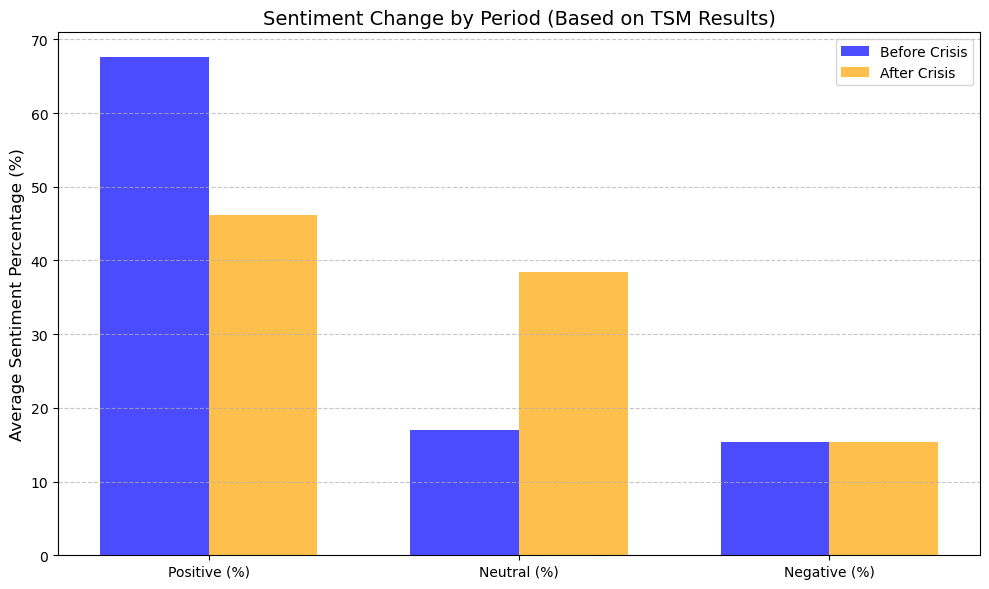

In [39]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data for sentiment change by period using TSM results
def plot_sentiment_change_by_period(tsm_before, tsm_after):
    # Aggregate sentiment percentages for each period
    before_avg = {
        "Positive (%)": tsm_before["Positive (%)"].mean(),
        "Neutral (%)": tsm_before["Neutral (%)"].mean(),
        "Negative (%)": tsm_before["Negative (%)"].mean(),
    }
    after_avg = {
        "Positive (%)": tsm_after["Positive (%)"].mean(),
        "Neutral (%)": tsm_after["Neutral (%)"].mean(),
        "Negative (%)": tsm_after["Negative (%)"].mean(),
    }

    # Plot settings
    sentiments = ["Positive (%)", "Neutral (%)", "Negative (%)"]
    before_values = [before_avg[sent] for sent in sentiments]
    after_values = [after_avg[sent] for sent in sentiments]

    x = np.arange(len(sentiments))  # Sentiment categories
    width = 0.35  # Width of bars

    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot bars for Before and After Crisis
    ax.bar(x - width / 2, before_values, width, label="Before Crisis", color="blue", alpha=0.7)
    ax.bar(x + width / 2, after_values, width, label="After Crisis", color="orange", alpha=0.7)

    # Customize the plot
    ax.set_title("Sentiment Change by Period (Based on TSM Results)", fontsize=14)
    ax.set_ylabel("Average Sentiment Percentage (%)", fontsize=12)
    ax.set_xticks(x)
    ax.set_xticklabels(sentiments)
    ax.legend(loc="upper right")
    ax.grid(axis="y", linestyle="--", alpha=0.7)

    plt.tight_layout()
    plt.show()

# Plot sentiment change by period
plot_sentiment_change_by_period(tsm_before_crisis, tsm_after_crisis)


##### Visualize word clouds for the sentiment distribution of defined topics from LDA

This function uses the WordCloud class from the wordcloud library to generate word clouds, and matplotlib to display the results of the sentiment distribution of topics identified by the Latent Dirichlet Allocation (LDA) model before and after a crisis. The word clouds are created based on sentiment categories (Positive, Neutral, Negative) and help to visually understand the most frequent words associated with each sentiment within each topic.


The function 'generate_wordclouds_for_sentiments' is generated, taking in:
- tsm: Topic Sentiment Mixture data.
- lda_model: The trained LDA model, which identifies topics in the corpus.
- corpus: The collection of documents in Bag-of-Words (BOW) format.
- sentiment_category: The sentiment category (Positive, Neutral, or Negative).
- num_topics: The total number of topics identified by the LDA model.


Then, the function loops over each topic, extracting documents that belong to the topic (based on the LDA model’s topic distribution).
After that, the document is analyzed using the VADER sentiment analysis (analyzer.polarity_scores) to determine if the sentiment falls into the chosen category (Positive, Neutral, or Negative).
- Positive Sentiment: If the compound score is ≥ 0.05.
- Neutral Sentiment: If the compound score is between -0.05 and 0.05.
- Negative Sentiment: If the compound score is ≤ -0.05.

Once all documents for the current topic and sentiment category are processed, the function combines all the relevant document texts into one large string (combined_text).
It then generates a word cloud for the combined text using the WordCloud class and matplotlib, which displays the most frequent words in that sentiment category for the topic.



Word Clouds Before the Crisis:


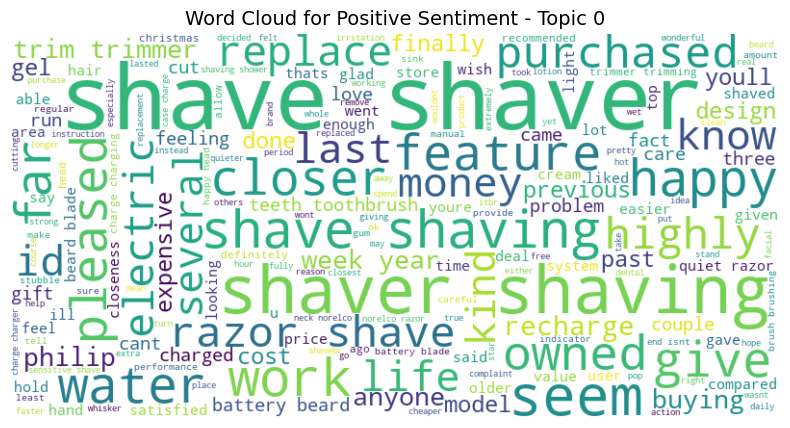

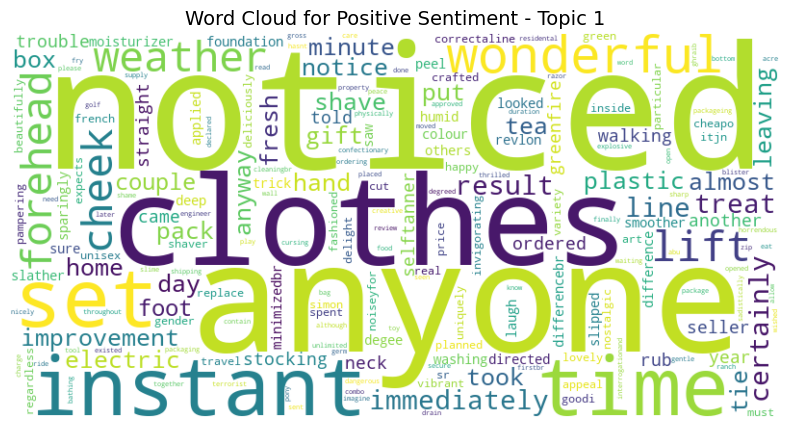

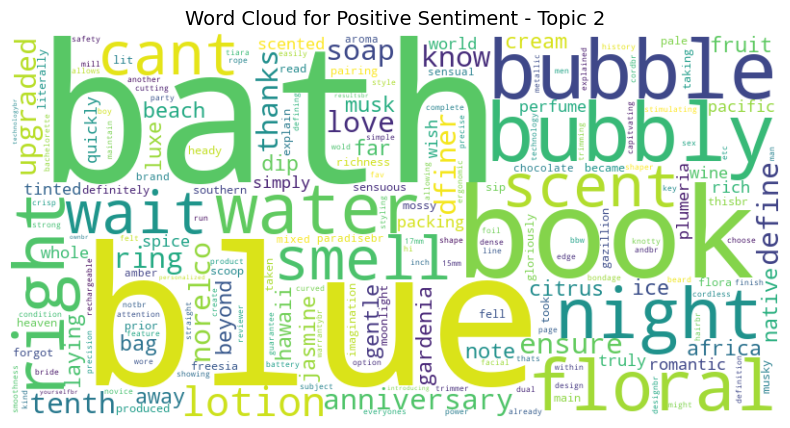

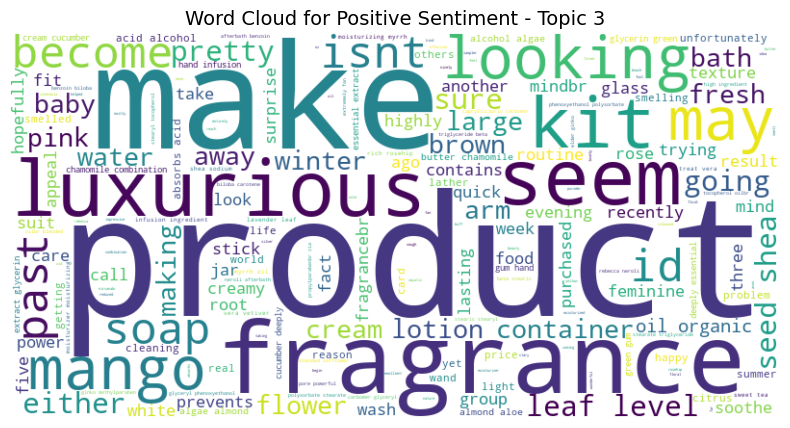

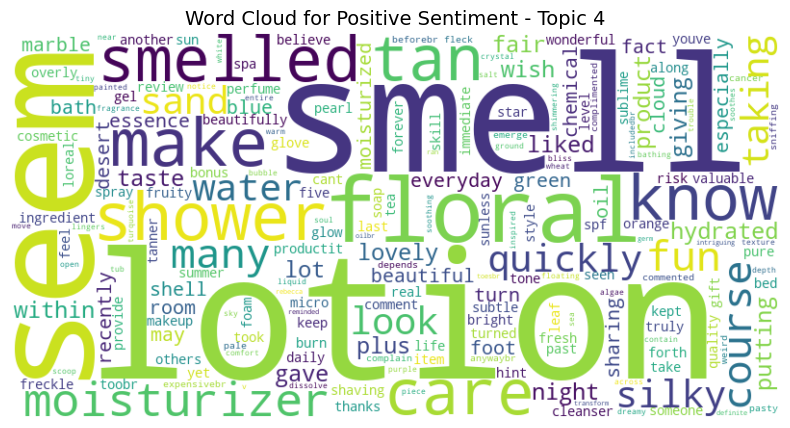

...

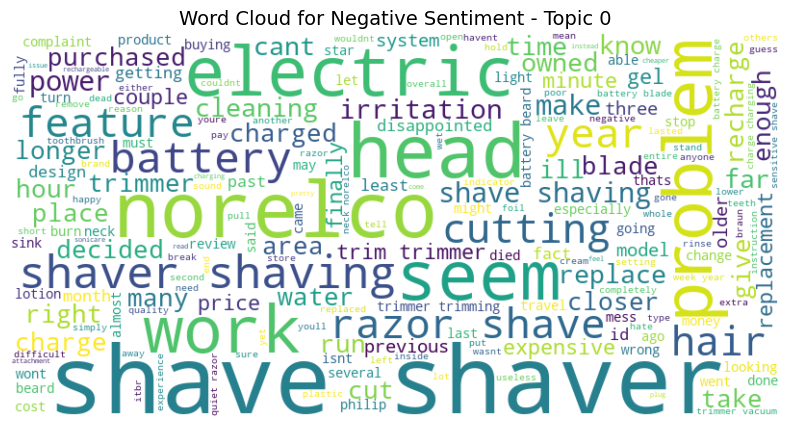

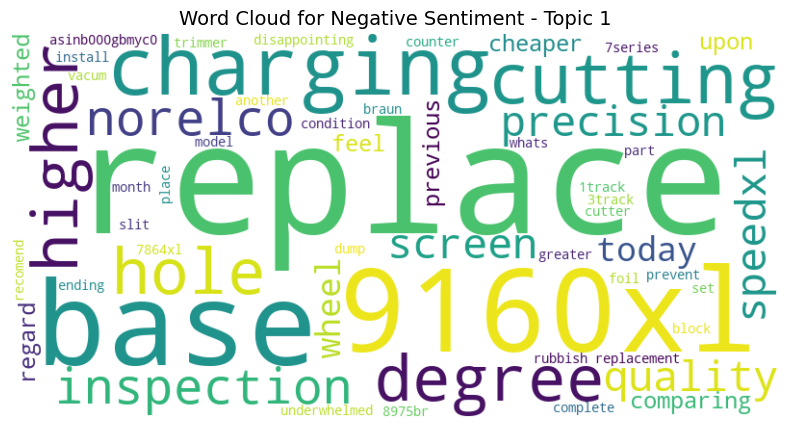

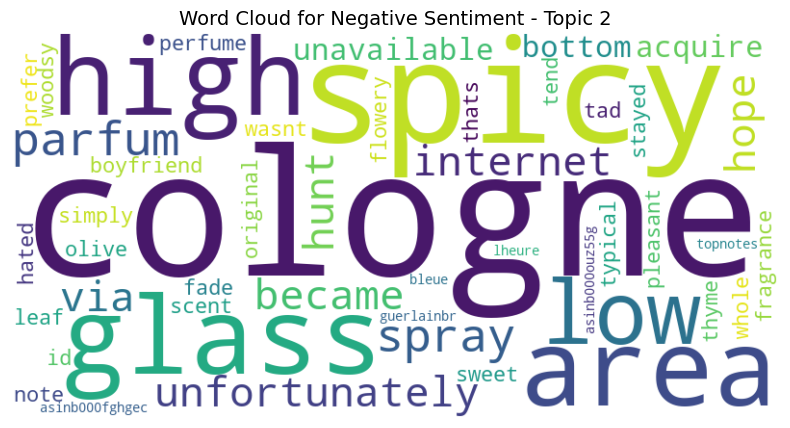

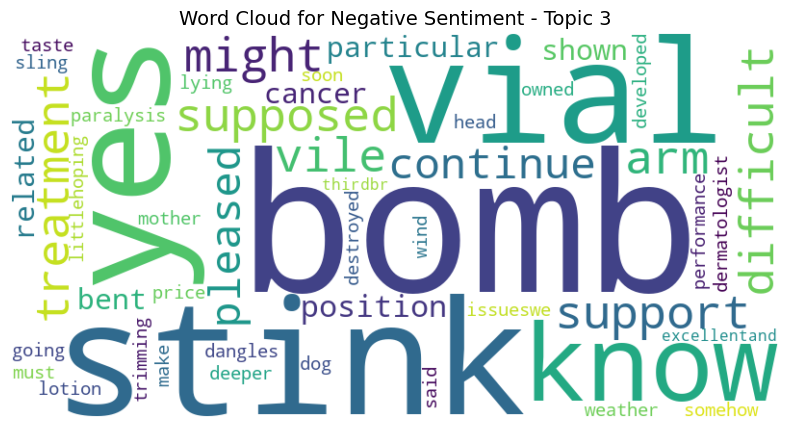

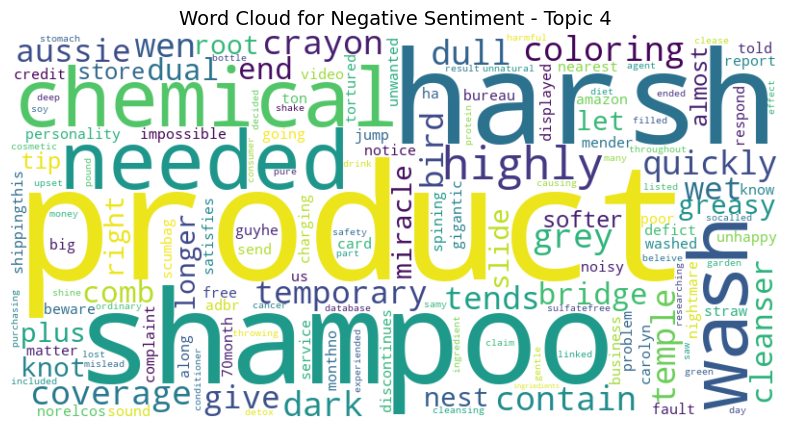


Word Clouds After the Crisis:


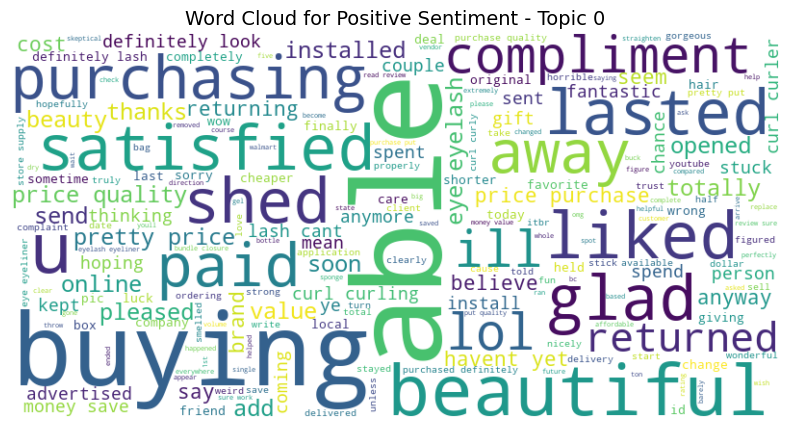

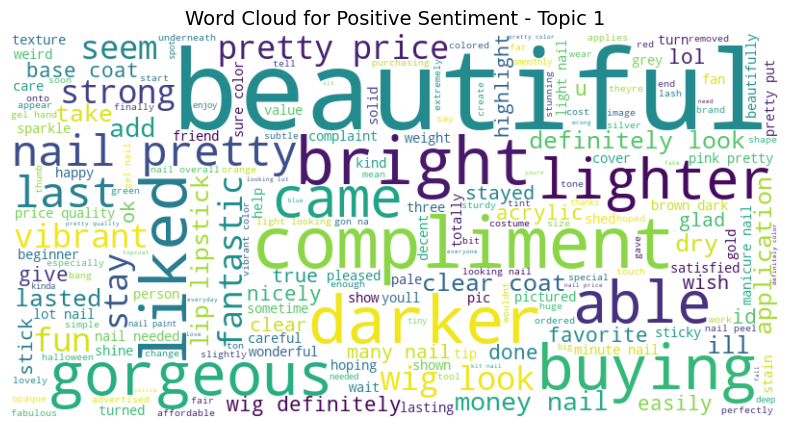

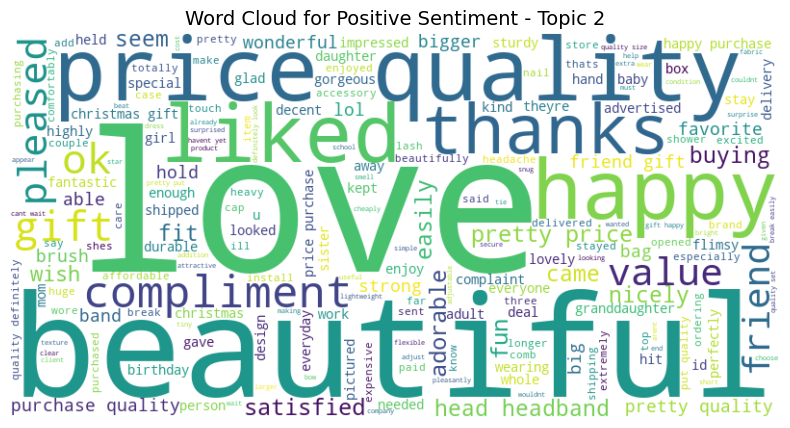

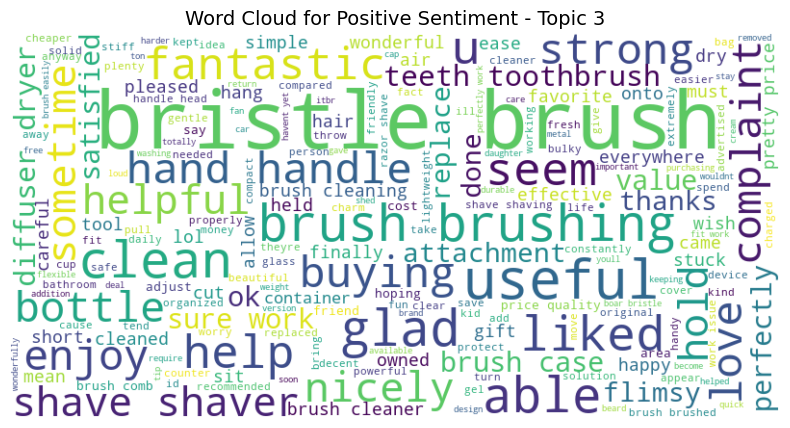

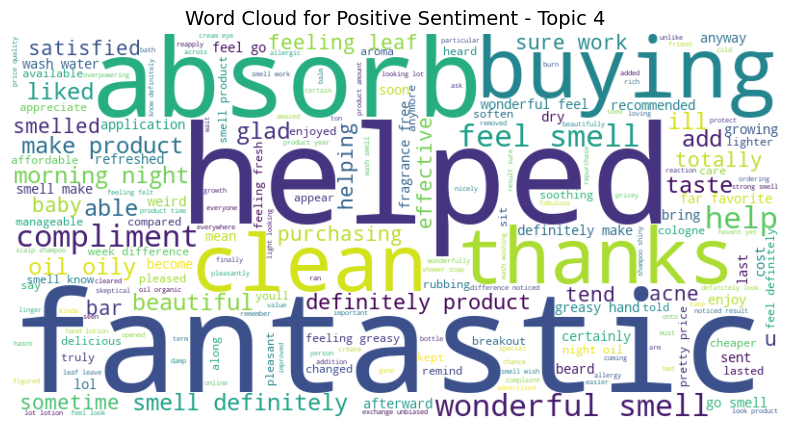

...

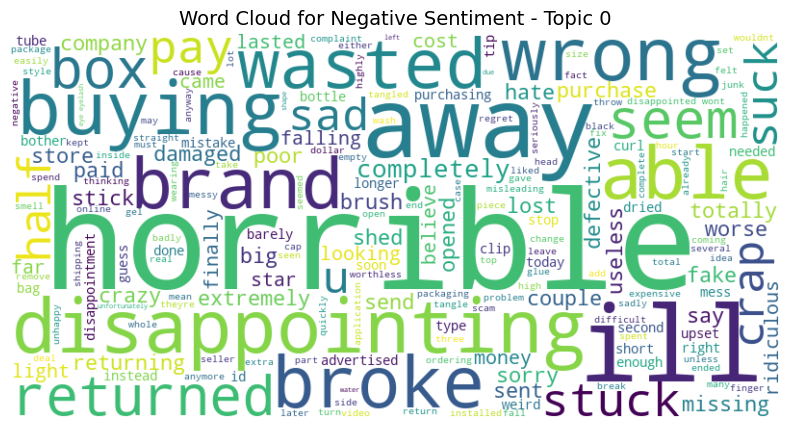

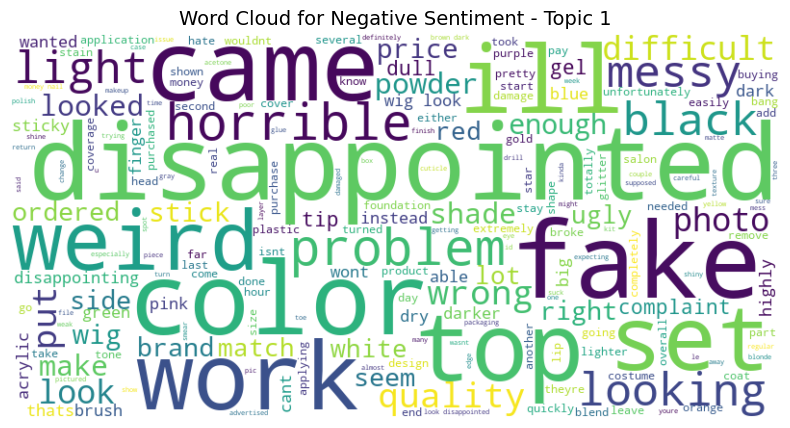

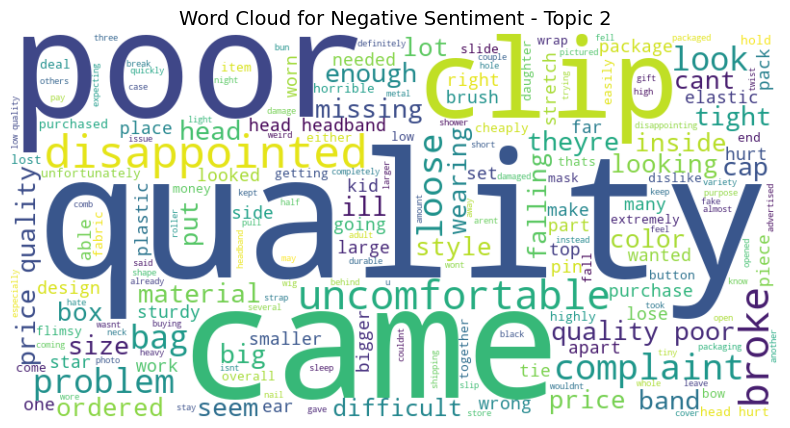

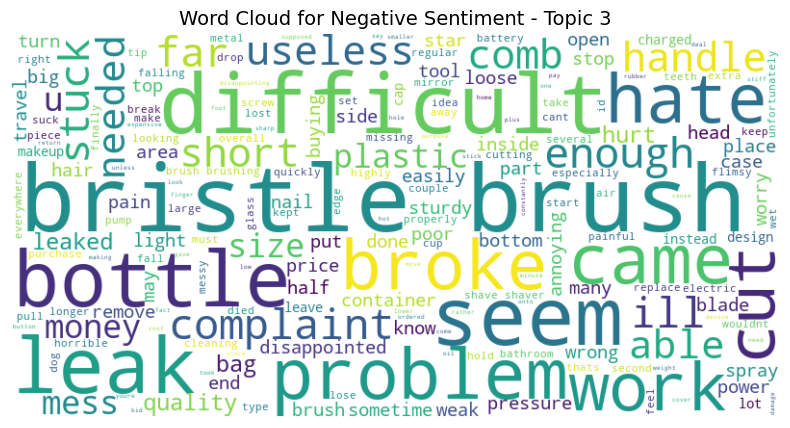

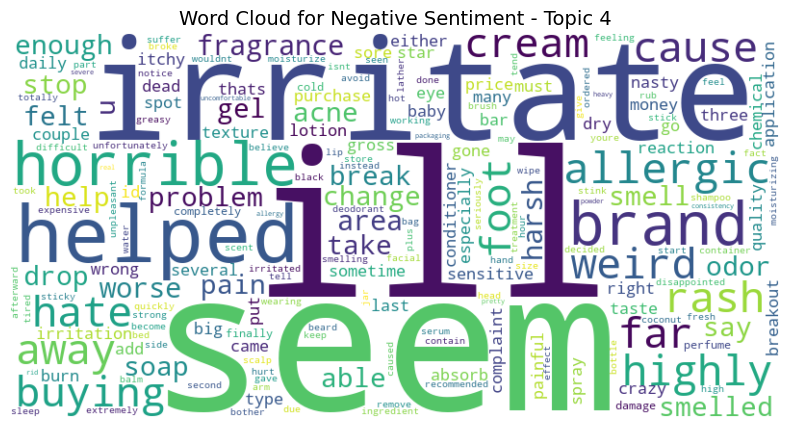

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word clouds for TSM results
def generate_wordclouds_for_sentiments(tsm, lda_model, corpus, sentiment_category, num_topics):
    for topic_id in range(num_topics):
        # Collect texts corresponding to the given topic and sentiment category
        texts = []
        for doc_bow in corpus:
            topic_distribution = lda_model.get_document_topics(doc_bow)
            dominant_topic = max(topic_distribution, key=lambda x: x[1])[0]  # Get topic with highest probability
            if dominant_topic == topic_id:
                document_text = " ".join([lda_model.id2word[word_id] for word_id, _ in doc_bow])
                sentiment = analyzer.polarity_scores(document_text)
                if (
                    (sentiment_category == "Positive" and sentiment["compound"] >= 0.05) or
                    (sentiment_category == "Neutral" and -0.05 < sentiment["compound"] < 0.05) or
                    (sentiment_category == "Negative" and sentiment["compound"] <= -0.05)
                ):
                    texts.append(document_text)

        # Combine all texts into one string
        combined_text = " ".join(texts)

        # Generate word cloud
        if combined_text.strip():  
            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color="white",
                colormap="viridis"
            ).generate(combined_text)

            # Plot the word cloud
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation="bilinear")
            plt.axis("off")
            plt.title(f"Word Cloud for {sentiment_category} Sentiment - Topic {topic_id}", fontsize=14)
            plt.show()
        else:
            print(f"No texts found for {sentiment_category} Sentiment - Topic {topic_id}")

# Generate word clouds for each sentiment category and period
print("\nWord Clouds Before the Crisis:")
for sentiment in ["Positive", "Neutral", "Negative"]:
    generate_wordclouds_for_sentiments(tsm_before_crisis, lda_before_crisis, corpus_before, sentiment, num_topics=5)

print("\nWord Clouds After the Crisis:")
for sentiment in ["Positive", "Neutral", "Negative"]:
    generate_wordclouds_for_sentiments(tsm_after_crisis, lda_after_crisis, corpus_after, sentiment, num_topics=5)
